In [59]:
import warnings

warnings.filterwarnings("ignore", module="erfa")


import astropy.units as u
import lightkurve as lk
import matplotlib.pyplot as plt
import numpy as np
from astropy.coordinates import SkyCoord
from astropy.time import Time
from matplotlib.animation import FFMpegWriter

from jorbit.mpchecker import animate_region, nearest_asteroid

In [60]:
separations, asteroids, coord_table, mag_table, total_mags = nearest_asteroid(
    coordinate=SkyCoord(125.7398 * u.deg, 18.7334 * u.deg),
    times=(Time("2021-10-13 01:24") + np.arange(-0.5, 1, 1 / 24 / 6) * u.day),
    radius=3 * u.arcmin,
    compute_contamination=True,
    observer="TESS",
)

In [ ]:
search = lk.search_lightcurve("TIC 14545390", sector=44)
search

#,mission,year,author,exptime,target_name,distance
,,,,s,,arcsec
0,TESS Sector 44,2021,SPOC,20,14545390,0.0
1,TESS Sector 44,2021,SPOC,120,14545390,0.0
2,TESS Sector 44,2021,TESS-SPOC,600,14545390,0.0


In [ ]:
lc = search[0].download()

[(-50.0, 150.0),
 (2500.059134054761, 2501.5521896103787),
 Text(0.5, 0, 'time - 2457000 [bjtd days]'),
 Text(0, 0.5, 'flux [e-/s]')]

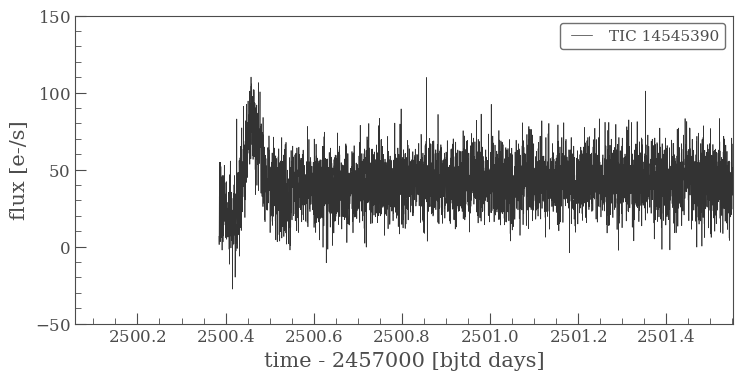

In [ ]:
times = Time("2021-10-13 01:24") + np.arange(-0.5, 1, 1 / 24 / 6) * u.day
ax = lc.plot()
ax.set(
    ylim=(-50, 150),
    xlim=(times[0].btjd, times[-1].btjd),
    xlabel="time - 2457000 [bjtd days]",
    ylabel="flux [e-/s]",
)

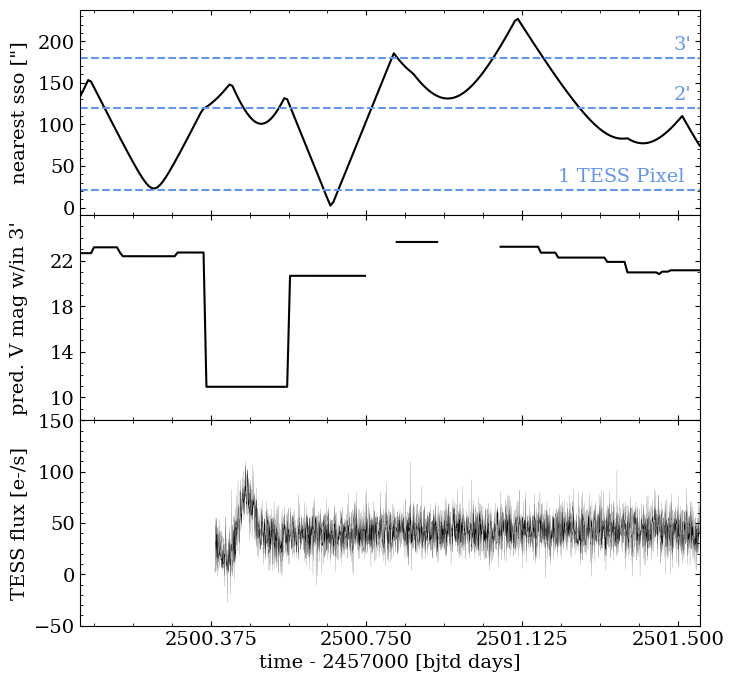

In [58]:
times = Time("2021-10-13 01:24") + np.arange(-0.5, 1, 1 / 24 / 6) * u.day

fig, ax = plt.subplots(nrows=3, figsize=(8, 8), sharex=True)

ax[0].plot(times.btjd, separations.to(u.arcsec), c="k")
ax[0].axhline(180, c="cornflowerblue", ls="--")
ax[0].annotate("3'", (times.btjd[-10], 190), color="cornflowerblue")
ax[0].axhline(120, c="cornflowerblue", ls="--")
ax[0].annotate("2'", (times.btjd[-10], 130), color="cornflowerblue")
ax[0].axhline(21, c="cornflowerblue", ls="--")
ax[0].annotate("1 TESS Pixel", (times.btjd[-50], 31), color="cornflowerblue")
ax[0].set(ylabel='nearest sso ["]')

ax[1].plot(times.btjd, total_mags, c="k")
ax[1].set(ylabel="pred. V mag w/in 3'", ylim=(8, 26), yticks=[10, 14, 18, 22])

ax[2].plot(lc.time.btjd, lc.flux, c="k", linewidth=0.1)
ax[2].set(
    xlabel="time - 2457000 [bjtd days]",
    xticks=np.linspace(2500, 2501.5, 5),
    xlim=(times[0].btjd, times[-1].btjd),
    ylabel="TESS flux [e-/s]",
    ylim=(-50, 150),
)

plt.subplots_adjust(hspace=0)
fig.align_ylabels()
plt.savefig("figures/nearest_asteroid.pdf", bbox_inches="tight")

In [ ]:
anim = animate_region(
    coordinate=SkyCoord(125.7398 * u.deg, 18.7334 * u.deg),
    times=(Time("2021-10-13 01:24") + np.arange(-0.5, 1, 1 / 24 / 6) * u.day),
    coord_table=coord_table,
    radius=3 * u.arcmin,
    frame_interval=50,
)

In [ ]:
# export as a gif, then as an mp4 for online figure version

anim.save("figures/nearest_asteroid.gif", writer="pillow")

writer = FFMpegWriter(
    fps=30, metadata=dict(artist="Ben Cassese"), bitrate=1800, codec="h264"
)
anim.save("figures/nearest_asteroid.mp4", writer=writer, dpi=100)

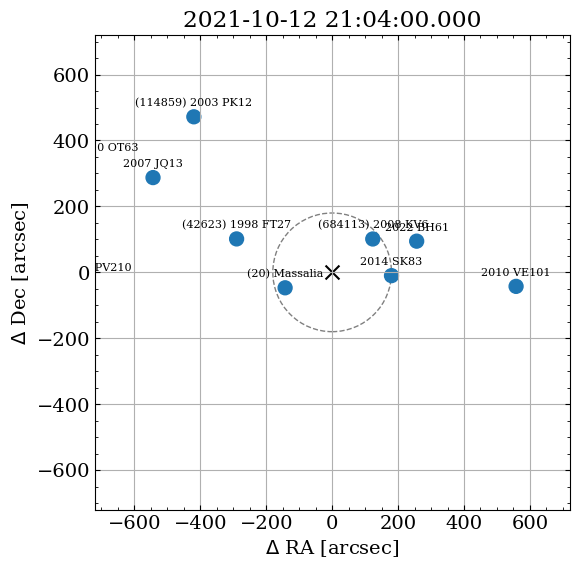

In [ ]:
# this is mostly a copy/paste from the animate_region function:
# need to expose these internals to save one frame as a pdf for the paper

import jax

jax.config.update("jax_enable_x64", True)

from matplotlib.patches import Circle

from jorbit.astrometry.sky_projection import tangent_plane_projection

coordinate = SkyCoord(125.7398 * u.deg, 18.7334 * u.deg)
times = Time("2021-10-13 01:24") + np.arange(-0.5, 1, 1 / 24 / 6) * u.day
coord_table = coord_table
radius = 3 * u.arcmin
frame_interval = 50


radius = radius.to(u.arcsec).value
tmp = jax.vmap(
    jax.vmap(tangent_plane_projection, in_axes=(None, None, 0, 0)),
    in_axes=(None, None, 0, 0),
)(
    coordinate.ra.rad,
    coordinate.dec.rad,
    coord_table["coord"].ra.rad,
    coord_table["coord"].dec.rad,
)
xs, ys = tmp[..., 0], tmp[..., 1]
xs = xs.T
ys = ys.T

particle_names = [str(i) for i in list(coord_table["name"])]

fig, ax = plt.subplots(figsize=(6, 6))

# Add the reference circle
circle = Circle((0, 0), radius, fill=False, linestyle="--", color="gray")
ax.add_patch(circle)
ax.scatter(0, 0, s=100, c="k", marker="x", label="Reference point")

title = ax.set_title("")

# Initialize scatter plot
scatter = ax.scatter(xs[0], ys[0], s=np.ones(xs.shape[1]) * 100)

# Initialize text annotations if names are provided
texts = []
texts = [
    ax.text(
        xs[0][i],
        ys[0][i],
        name,
        horizontalalignment="center",
        verticalalignment="bottom",
        animated=True,
        fontsize=8,
        color="k",
        clip_on=True,
    )
    for i, name in enumerate(particle_names)
]

ax.set(
    xlim=(-radius * 4, radius * 4),
    ylim=(-radius * 4, radius * 4),
    xlabel=r"$\Delta$ RA [arcsec]",
    ylabel=r"$\Delta$ Dec [arcsec]",
    aspect="equal",
)
ax.grid(True)
ax.autoscale(False)
plt.tight_layout()


def _update(frame: int) -> tuple:
    scatter.set_offsets(np.c_[xs[frame], ys[frame]])
    title.set_text(times[frame].iso)
    for i, text in enumerate(texts):
        text.set_position((xs[frame][i], ys[frame][i] + radius * 0.15))
    return (scatter, *texts)


_update(46)
plt.savefig("figures/nearest_asteroid_frame.pdf", bbox_inches="tight")

In [ ]:
# target_files = glob("data/tess_ecliptic_targets/*.csv")
# mags = []
# for f in target_files:
#     mags.extend(list(pd.read_csv(f, skiprows=5)["Tmag"]))
# mags = np.array(mags)
# np.sum(mags > 15) / len(mags)

np.float64(0.3779097163321082)

In [ ]:
(10**0.4) ** (16 - 21)

0.01